In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import tensorflow as tf

In [3]:
import pandas as pd
from tensorflow.keras.utils import plot_model
import numpy as np
import codecs
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud
import seaborn as sns
from sklearn.model_selection import train_test_split


%matplotlib inline

In [4]:
tf.__version__

'2.18.0'

In [5]:
import warnings
warnings.filterwarnings('ignore')

# Process Data

In [6]:
df = pd.DataFrame(columns=['en','fa'])
df

,en,fa


In [7]:
import codecs

# مسیر فایل‌ها
en_path = "/content/drive/MyDrive/NLP/MT/en-fa.txt/TEP.en-fa.en"
fa_path = "/content/drive/MyDrive/NLP/MT/en-fa.txt/TEP.en-fa.fa"

# تعداد خطوطی که می‌خوای بخونی: None = همه خطوط
max_lines = None  # یا مثلاً: max_lines = 100000 برای خواندن فقط 100 هزار خط

# خواندن فایل‌ها هم‌زمان و سریع
en_lines = []
fa_lines = []

with codecs.open(en_path, "r", "utf-8") as f_en, codecs.open(fa_path, "r", "utf-8") as f_fa:
    for i, (en_line, fa_line) in enumerate(zip(f_en, f_fa)):
        if max_lines is not None and i >= max_lines:
            break
        en_lines.append(en_line.strip())
        fa_lines.append(fa_line.strip())

# ساخت دیتافریم نهایی
df = pd.DataFrame({'en': en_lines, 'fa': fa_lines})

# نمایش ۵ سطر اول برای بررسی
df.head()

,en,fa
0,raspy breathing .,صداي خر خر .
1,dad .,پدر .
2,maybe its the wind .,شايد صداي باد باشه .
3,no .,نه .
4,stop please stop .,دست نگه داريد خواهش ميکنم دست نگه داريد .


In [8]:
df.shape

(612086, 2)

In [9]:
# حذف نقطه فقط از انتهای جملات
df['en'] = df['en'].str.rstrip('.')
df['fa'] = df['fa'].str.rstrip('.')
df

,en,fa
0,raspy breathing,صداي خر خر
1,dad,پدر
2,maybe its the wind,شايد صداي باد باشه
3,no,نه
4,stop please stop,دست نگه داريد خواهش ميکنم دست نگه داريد
...,...,...
612081,zodiac,دايره‌البروج
612082,zodiacal light,حمره مغربيه
612083,zombi,انسان زنده شد
612084,zombiism,مارخداگرائي


In [10]:
df['en_len'] = df['en'].str.split().apply(len)
df['fa_len'] = df['fa'].str.split().apply(len)

In [11]:
# ساخت دیتافریم برای رسم هیستوگرام مشترک
df_plot = pd.DataFrame({
    'Length': df['en_len'].tolist() + df['fa_len'].tolist(),
    'Language': ['English'] * len(df) + ['Farsi'] * len(df)
})

# رسم هیستوگرام تعاملی بدون فیلتر طول
fig = px.histogram(
    df_plot,
    x='Length',
    color='Language',
    nbins=60,
    barmode='overlay',
    marginal='box',
    opacity=0.6,
    template='plotly_dark',
    title='Interactive Histogram of Sentence Lengths (All Data)'
)

fig.update_layout(
    xaxis_title='Number of Words per Sentence',
    yaxis_title='Frequency',
    bargap=0.1
)

fig.show()

In [12]:
# درصد جملاتی که طولشون در هر زبان <= 30 هست
within_limit = df[(df['en_len'] <= 18) & (df['fa_len'] <= 18)]
percent_within_30 = (len(within_limit) / len(df)) * 100

print(f"✅ درصد جملات با طول <= 18 در هر دو زبان: {percent_within_30:.2f}%")

✅ درصد جملات با طول <= 18 در هر دو زبان: 99.35%


In [13]:
fig = px.scatter(
    df, x='en_len', y='fa_len',
    title="Sentence Length: English vs Farsi",
    labels={'en_len': 'English Sentence Length', 'fa_len': 'Farsi Sentence Length'},
    opacity=0.5,
    template='plotly_dark'
)
fig.show()

In [14]:
filtered_df = df[(df['en_len'] <= 18) & (df['fa_len'] <= 18)].copy()

print(f"📉 تعداد جملات بعد از فیلتر: {len(filtered_df):,}")
print(f"🗑 حذف شده‌ها: {len(df) - len(filtered_df):,} جمله با طول > 18 در حداقل یکی از زبان‌ها")

df = filtered_df

📉 تعداد جملات بعد از فیلتر: 608,090
🗑 حذف شده‌ها: 3,996 جمله با طول > 18 در حداقل یکی از زبان‌ها


In [15]:
df['length_ratio'] = df['fa_len'] / df['en_len']
fig = px.histogram(
    df, x='length_ratio',
    nbins=60,
    title="Ratio of Farsi to English Sentence Lengths",
    template='plotly_dark'
)
fig.update_layout(xaxis_title='Farsi Length / English Length', yaxis_title='Count')
fig.show()

In [16]:
too_short_fa = df[df['length_ratio'] < 0.25]
too_long_fa = df[df['length_ratio'] > 3]
in_safe_range = df[(df['length_ratio'] >= 0.5) & (df['length_ratio'] <= 2)]

print(f"🔻 جملات با ترجمه فارسی بسیار کوتاه (<0.25): {len(too_short_fa):,} جمله ({len(too_short_fa)/len(df)*100:.2f}%)")
print(f"🔺 جملات با ترجمه فارسی بسیار طولانی (>3): {len(too_long_fa):,} جمله ({len(too_long_fa)/len(df)*100:.2f}%)")
print(f"✅ جملات در بازه امن (0.5 - 2): {len(in_safe_range):,} جمله ({len(in_safe_range)/len(df)*100:.2f}%)")

🔻 جملات با ترجمه فارسی بسیار کوتاه (<0.25): 577 جمله (0.09%)
🔺 جملات با ترجمه فارسی بسیار طولانی (>3): 1,716 جمله (0.28%)
✅ جملات در بازه امن (0.5 - 2): 582,902 جمله (95.86%)


In [17]:
print("🔻 جملات با ترجمه فارسی خیلی کوتاه:")
display(too_short_fa[['en', 'fa', 'en_len', 'fa_len', 'length_ratio']].head(5))

print("\n🔺 جملات با ترجمه فارسی خیلی بلند:")
display(too_long_fa[['en', 'fa', 'en_len', 'fa_len', 'length_ratio']].head(5))

🔻 جملات با ترجمه فارسی خیلی کوتاه:


,en,fa,en_len,fa_len,length_ratio
1522,"hey , hey , hey , hey . over here . through here",از اين طرف,13,3,0.230769
1555,"a kingdom , your very life",پادشاهي,6,1,0.166667
1584,"you know , as things move forward",ميدوني,7,1,0.142857
1650,why i thought someone believed in me,چرا,7,1,0.142857
2027,youll never get that shot,عمرا,5,1,0.200000



🔺 جملات با ترجمه فارسی خیلی بلند:


,en,fa,en_len,fa_len,length_ratio
2154,their favorite,اين ، آهنگ مورد علاقه ي منه,2,7,3.5
2757,hand,مواظب باش پشت سرت,1,4,4.0
3117,,مال من بود,0,3,inf
3124,,افراد وظايف تون را انجام بديد,0,6,inf
3392,slayers,يه آدمكش ممكنه اينجا باشه,1,5,5.0


In [18]:
# تعریف بازه سالم برای نسبت طول
min_ratio = 0.5
max_ratio = 2.24

df = df[(df['length_ratio'] >= min_ratio) & (df['length_ratio'] <= max_ratio)]

print(f"✅ تعداد جملات باقی‌مانده پس از فیلتر: {len(df):,}")

✅ تعداد جملات باقی‌مانده پس از فیلتر: 583,486


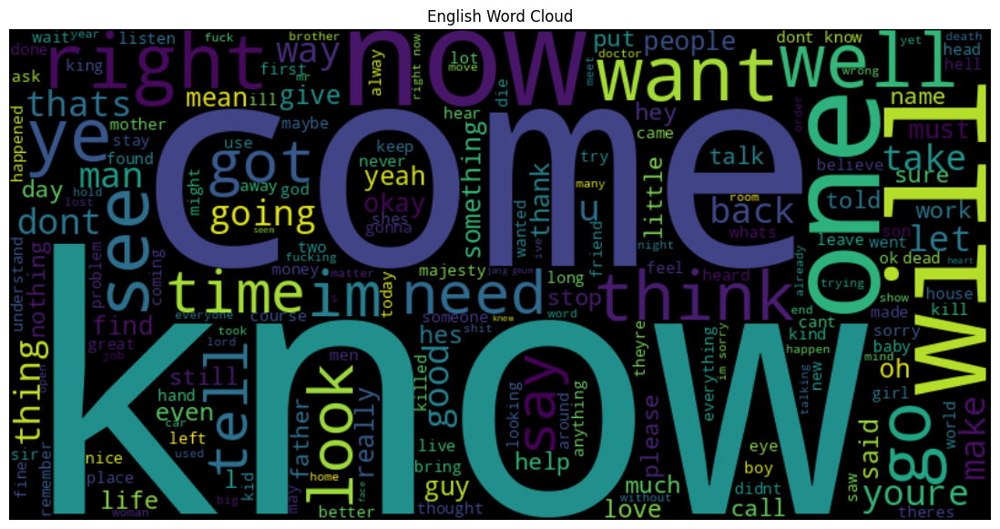

In [19]:
text = ' '.join(df['en'].tolist())
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("English Word Cloud")
plt.show()

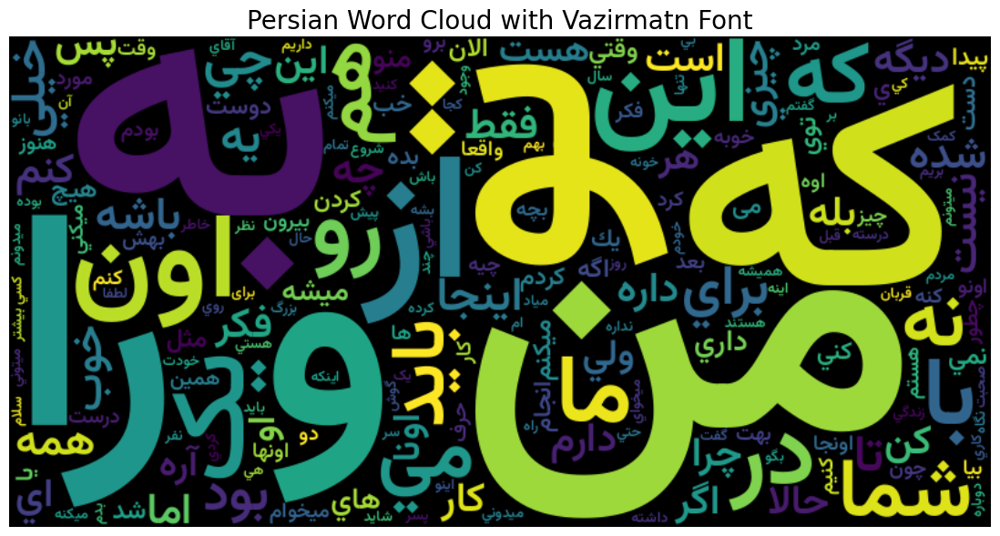

In [20]:
font_path = '/content/drive/MyDrive/NLP/MT/en-fa.txt/Vazirmatn-SemiBold.ttf'

text = ' '.join(df['fa'].tolist())

wordcloud = WordCloud(
    width=800,
    height=400,
    font_path=font_path,
    background_color='black',
    collocations=False
).generate(text)

plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Persian Word Cloud with Vazirmatn Font", fontsize=20)
plt.show()

In [21]:
duplicate_en = df['en'].value_counts()
duplicate_fa = df['fa'].value_counts()

repeated_en = duplicate_en[duplicate_en > 1]
repeated_fa = duplicate_fa[duplicate_fa > 1]

print("🔁 Top 10 Repeated English Sentences:")
print(repeated_en.head(10))

print("\n🔁 Top 10 Repeated Farsi Sentences:")
print(repeated_fa.head(10))

🔁 Top 10 Repeated English Sentences:
en
yes               1730
what?              764
what is it?        547
blank              401
no                 362
yes, sir           294
what happened?     282
yes!               278
your majesty       234
thank you          231
Name: count, dtype: int64

🔁 Top 10 Repeated Farsi Sentences:
fa
بله          1634
خالی          401
چي؟           367
چي شده؟       339
نه            284
بله قربان     236
سرورم         234
بسيار خوب     227
باشه          194
درسته         182
Name: count, dtype: int64


In [22]:
all_en_words = " ".join(df['en']).split()
all_fa_words = " ".join(df['fa']).split()

unique_en_words = set(all_en_words)
unique_fa_words = set(all_fa_words)

print("📉 Vocabulary Statistics:")
print(f"✅ Number of unique English words: {len(unique_en_words):,}")
print(f"✅ Number of unique Farsi words:   {len(unique_fa_words):,}")

📉 Vocabulary Statistics:
✅ Number of unique English words: 97,223
✅ Number of unique Farsi words:   144,137


In [23]:
heatmap_data = df.groupby(['fa_len', 'en_len']).size().reset_index(name='count')

fig = px.density_heatmap(
    heatmap_data,
    x='en_len',
    y='fa_len',
    z='count',
    nbinsx=50,
    nbinsy=50,
    color_continuous_scale='Viridis',
    labels={'en_len': 'English Sentence Length', 'fa_len': 'Farsi Sentence Length', 'count': 'Frequency'},
    title="🔥 Interactive Heatmap of Sentence Lengths (Farsi vs English)"
)

fig.update_layout(
    xaxis_title="English Sentence Length",
    yaxis_title="Farsi Sentence Length",
    template='plotly_dark'
)

fig.show()

In [24]:
train_df, temp_df = train_test_split(df, test_size=0.10, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

# نمایش اندازه هر بخش
print(f"✅ تعداد کل داده‌ها: {len(df):,}")
print(f"📘 تعداد داده‌های آموزش (train): {len(train_df):,}")
print(f"📙 تعداد داده‌های اعتبارسنجی (validation): {len(val_df):,}")
print(f"📕 تعداد داده‌های آزمون (test): {len(test_df):,}")

✅ تعداد کل داده‌ها: 583,486
📘 تعداد داده‌های آموزش (train): 525,137
📙 تعداد داده‌های اعتبارسنجی (validation): 29,174
📕 تعداد داده‌های آزمون (test): 29,175


In [25]:
from transformers import MBart50TokenizerFast

# بارگذاری tokenizer مخصوص mbart-50
tokenizer = MBart50TokenizerFast.from_pretrained("facebook/mbart-large-50")

In [26]:
tokenizer.src_lang = "en_XX"
train_df['en_tok_len'] = train_df['en'].apply(lambda x: len(tokenizer.encode(x)))

tokenizer.src_lang = "fa_IR"
train_df['fa_tok_len'] = train_df['fa'].apply(lambda x: len(tokenizer.encode(x)))

In [27]:
sentence_en = "How are you?"
inputs_en = tokenizer(sentence_en, return_tensors="pt", padding=True, truncation=True, max_length=18)

print("🔹 توکن‌ها:")
print(tokenizer.convert_ids_to_tokens(inputs_en['input_ids'][0]))

🔹 توکن‌ها:
['fa_IR', '▁How', '▁are', '▁you', '?', '</s>']


In [28]:
sentence_fa = "من امید مرادی 24 سال سن دارم. من یک دانشمند داده هستم."
inputs_fa = tokenizer(sentence_fa, return_tensors="pt", padding=True, truncation=True, max_length=18)

print("🔹 توکن‌ها:")
print(tokenizer.convert_ids_to_tokens(inputs_fa['input_ids'][0]))

🔹 توکن‌ها:
['fa_IR', '▁من', '▁امید', '▁مراد', 'ی', '▁24', '▁سال', '▁سن', '▁دارم', '.', '▁من', '▁یک', '▁دانش', 'مند', '▁داده', '▁هستم', '.', '</s>']


In [29]:
!pip install -q transformers sentencepiece

In [30]:
def tokenize_dataset(df_split, tokenizer, max_len=18):
    input_encodings = tokenizer(
        df_split['en'].tolist(),
        return_tensors="np",  # برای ذخیره به صورت NumPy
        padding="max_length",
        truncation=True,
        max_length=max_len
    )
    target_encodings = tokenizer(
        df_split['fa'].tolist(),
        return_tensors="np",
        padding="max_length",
        truncation=True,
        max_length=max_len
    )
    return input_encodings['input_ids'], target_encodings['input_ids']


In [31]:
import numpy as np

# فرض بر این است که train_df، val_df، test_df وجود دارند

train_inputs, train_targets = tokenize_dataset(train_df, tokenizer)
val_inputs, val_targets = tokenize_dataset(val_df, tokenizer)
test_inputs, test_targets = tokenize_dataset(test_df, tokenizer)

# ذخیره به صورت فایل NumPy
np.save("train_inputs.npy", train_inputs)
np.save("train_targets.npy", train_targets)
np.save("val_inputs.npy", val_inputs)
np.save("val_targets.npy", val_targets)
np.save("test_inputs.npy", test_inputs)
np.save("test_targets.npy", test_targets)

print("✅ ذخیره داده‌های توکنیزه شده انجام شد.")

✅ ذخیره داده‌های توکنیزه شده انجام شد.


In [32]:
# انتخاب یک نمونه
i = 42  # یا هر ایندکس دلخواه

text = train_df.iloc[i]['en']
tokens = tokenizer.tokenize(text)
ids = tokenizer.encode(text)

print("🔤 جمله:")
print(text)
print("\n🔢 توکن‌ها:")
print(tokens)
print("\n🆔 IDها:")
print(ids)
print("\n📏 تعداد توکن‌ها:", len(ids))

🔤 جمله:
is not revealed again

🔢 توکن‌ها:
['▁is', '▁not', '▁reveal', 'ed', '▁again']

🆔 IDها:
[250029, 83, 959, 122273, 297, 13438, 2]

📏 تعداد توکن‌ها: 7


In [33]:
max_len = 18
over_limit_en = (train_df['en_tok_len'] > max_len).mean() * 100
over_limit_fa = (train_df['fa_tok_len'] > max_len).mean() * 100

print(f"📊 درصد جملات انگلیسی با بیش از {max_len} توکن: {over_limit_en:.2f}%")
print(f"📊 درصد جملات فارسی با بیش از {max_len} توکن: {over_limit_fa:.2f}%")

📊 درصد جملات انگلیسی با بیش از 18 توکن: 6.62%
📊 درصد جملات فارسی با بیش از 18 توکن: 13.18%


In [34]:
from collections import Counter

all_tokens = []
for sent in train_df['en'].tolist():
    all_tokens += tokenizer.tokenize(sent)

token_freq = Counter(all_tokens)
common_tokens = token_freq.most_common(20)

print("🔠 ۲۰ توکن پرتکرار:")
for tok, count in common_tokens:
    print(f"{tok:15} → {count:,}")

🔠 ۲۰ توکن پرتکرار:
▁               → 215,034
,               → 174,535
▁you            → 135,057
▁the            → 110,988
▁i              → 103,256
s               → 93,466
.               → 90,177
▁to             → 84,417
▁a              → 67,261
'               → 59,327
▁it             → 51,186
▁and            → 46,665
▁that           → 44,743
▁of             → 40,862
▁is             → 39,052
?               → 37,239
▁what           → 35,100
▁in             → 34,243
▁your           → 33,815
▁me             → 32,782


In [35]:
# رسم هیستوگرام طول توکن‌های انگلیسی
fig_en = px.histogram(
    train_df,
    x='en_tok_len',
    nbins=40,
    title='🔢 توزیع تعداد توکن‌ها در جملات انگلیسی',
    labels={'en_tok_len': 'Token Count'},
    template='plotly_dark'
)
fig_en.show()

# رسم هیستوگرام طول توکن‌های فارسی
fig_fa = px.histogram(
    train_df,
    x='fa_tok_len',
    nbins=40,
    title='🔢 توزیع تعداد توکن‌ها در جملات فارسی',
    labels={'fa_tok_len': 'Token Count'},
    template='plotly_dark'
)
fig_fa.show()

In [36]:
# ساخت دوباره لیست توکن‌ها از انگلیسی
tokenizer.src_lang = "en_XX"
all_tokens = []
for text in train_df['en'].tolist():
    all_tokens += tokenizer.tokenize(text)

# شمارش توکن‌ها و تبدیل به DataFrame
token_freq = Counter(all_tokens).most_common(20)
df_tok = pd.DataFrame(token_freq, columns=["Token", "Frequency"])

# رسم گراف
fig = px.bar(
    df_tok,
    x="Token",
    y="Frequency",
    title="🔠 ۲۰ توکن پرتکرار در جملات انگلیسی",
    template="plotly_dark",
    text="Frequency"
)
fig.update_traces(textposition="outside")
fig.show()

In [37]:
# اطمینان از ست شدن زبان روی فارسی
tokenizer.src_lang = "fa_IR"

# استخراج توکن‌های کل جملات فارسی
fa_tokens = []
for text in train_df['fa'].tolist():
    fa_tokens += tokenizer.tokenize(text)

# شمارش توکن‌ها
fa_token_freq = Counter(fa_tokens).most_common(20)
df_fa_tok = pd.DataFrame(fa_token_freq, columns=["Token", "Frequency"])

# ترسیم نمودار میله‌ای
fig = px.bar(
    df_fa_tok,
    x="Token",
    y="Frequency",
    title="🔠 ۲۰ توکن پرتکرار در جملات فارسی",
    template="plotly_dark",
    text="Frequency"
)
fig.update_traces(textposition="outside")
fig.show()

In [38]:
from torch.utils.data import Dataset

class TranslationDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len=20, src_lang="en_XX", tgt_lang="fa_IR"):
        self.tokenizer = tokenizer
        self.data = dataframe
        self.max_len = max_len
        self.src_texts = self.data['en'].tolist()
        self.tgt_texts = self.data['fa'].tolist()
        self.src_lang = src_lang
        self.tgt_lang = tgt_lang

    def __len__(self):
        return len(self.src_texts)

    def __getitem__(self, index):
        source = self.src_texts[index]
        target = self.tgt_texts[index]

        self.tokenizer.src_lang = self.src_lang
        self.tokenizer.tgt_lang = self.tgt_lang

        model_inputs = self.tokenizer(
            source,
            max_length=self.max_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
            text_target=target
        )

        input_ids = model_inputs['input_ids'].squeeze()
        attention_mask = model_inputs['attention_mask'].squeeze()
        labels = model_inputs['labels'].squeeze()
        labels[labels == self.tokenizer.pad_token_id] = -100

        return {
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "labels": labels
        }


In [39]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️ Using device: {device}")

🖥️ Using device: cuda


In [40]:
from transformers import MBartForConditionalGeneration

# بررسی اینکه GPU در دسترس هست
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"📦 Model will run on: {device}")

# بارگذاری مدل
model = MBartForConditionalGeneration.from_pretrained("facebook/mbart-large-50")

# تنظیم زبان خروجی به فارسی
model.config.forced_bos_token_id = tokenizer.lang_code_to_id["fa_IR"]

# انتقال مدل به GPU (در صورت وجود)
model.to(device)

📦 Model will run on: cuda


MBartForConditionalGeneration(
  (model): MBartModel(
    (shared): MBartScaledWordEmbedding(250054, 1024, padding_idx=1)
    (encoder): MBartEncoder(
      (embed_tokens): MBartScaledWordEmbedding(250054, 1024, padding_idx=1)
      (embed_positions): MBartLearnedPositionalEmbedding(1026, 1024)
      (layers): ModuleList(
        (0-11): 12 x MBartEncoderLayer(
          (self_attn): MBartAttention(
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (activation_fn): GELUActivation()
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (fc2): Linear(in_features=4096, out_features=1024, bias=True

In [41]:
from transformers import TrainingArguments, Trainer

# مسیر ذخیره مدل
output_dir = "/content/drive/MyDrive/NLP/MT"

training_args = TrainingArguments(
    output_dir=output_dir,                           # محل اصلی ذخیره مدل
    eval_strategy="steps",                     # ارزیابی در هر تعداد مشخصی از steps (نه فقط epoch) -> changed from evaluation_strategy
    save_strategy="steps",                           # ذخیره در هر چند گام مشخص
    save_steps=50,                                   # ⬅ ذخیره هر 50 گام
    eval_steps=50,                                   # ⬅ ارزیابی هم هر 50 گام انجام بشه
    logging_steps=10,                                # ⬅ لاگ‌گیری هر 10 گام (اختیاری برای جزئیات بیشتر)
    per_device_train_batch_size=2,
    per_device_eval_batch_size=2,
    gradient_accumulation_steps=4,
    learning_rate=2e-5,
    weight_decay=0.01,
    num_train_epochs=1,
    warmup_steps=200,
    logging_dir=output_dir + "/logs",
    save_total_limit=1,                              # آخرین 1 چک‌پوینت فقط نگه داشته بشن
    fp16=True,
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    greater_is_better=False,
    report_to="none"
)

In [42]:
train_dataset = TranslationDataset(train_df, tokenizer)
val_dataset = TranslationDataset(val_df, tokenizer)

In [43]:
torch.cuda.empty_cache()

In [ ]:
checkpoint_path = "/content/drive/MyDrive/NLP/MT/checkpoint-9250"

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer
)

# آموزش مدل از چک‌پوینت مشخص شده
trainer.train(resume_from_checkpoint=checkpoint_path)

In [45]:
trainer.save_model("/content/drive/MyDrive/NLP/MT/model/final_mbart_model")
tokenizer.save_pretrained("/content/drive/MyDrive/NLP/MT/model/final_mbart_model")

('/content/drive/MyDrive/NLP/MT/model/final_mbart_model/tokenizer_config.json',
 '/content/drive/MyDrive/NLP/MT/model/final_mbart_model/special_tokens_map.json',
 '/content/drive/MyDrive/NLP/MT/model/final_mbart_model/sentencepiece.bpe.model',
 '/content/drive/MyDrive/NLP/MT/model/final_mbart_model/added_tokens.json',
 '/content/drive/MyDrive/NLP/MT/model/final_mbart_model/tokenizer.json')

In [46]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import torch

model_path = "/content/drive/MyDrive/NLP/MT/model/final_mbart_model"

# بارگذاری توکنایزر
tokenizer = AutoTokenizer.from_pretrained(model_path)

# بارگذاری مدل آموزش‌دیده
model = AutoModelForSeq2SeqLM.from_pretrained(model_path)

# (اختیاری) مدل را برای ارزیابی و ترجمه در حالت "eval" قرار دهید
# این کار لایه‌هایی مانند Dropout را غیرفعال می‌کند
model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


print("✅ مدل و توکنایزر با موفقیت بارگذاری شدند و آماده استفاده هستند.")

✅ مدل و توکنایزر با موفقیت بارگذاری شدند و آماده استفاده هستند.


In [47]:
def translate(text):
    """
    این تابع یک جمله انگلیسی را دریافت کرده و ترجمه فارسی آن را با استفاده از مدل
    آموزش‌دیده برمی‌گرداند.
    """
    # 1. توکنایز کردن جمله ورودی و افزودن توکن‌های خاص
    # return_tensors="pt" خروجی را به فرمت PyTorch tensor درمی‌آورد
    inputs = tokenizer(text, return_tensors="pt")

    # 2. انتقال ورودی‌ها به همان دستگاهی که مدل روی آن قرار دارد (CPU or GPU)
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # 3. تولید خروجی (دنباله‌ای از IDها) توسط مدل
    # می‌توانید پارامترهایی مانند num_beams, max_length و... را برای کنترل خروجی تغییر دهید
    generated_ids = model.generate(**inputs, max_length=128, num_beams=5, early_stopping=True)

    # 4. دیکود کردن ID های خروجی به متن فارسی و حذف توکن‌های خاص
    translated_text = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]

    return translated_text

# --- آزمایش تابع ---
english_sentence = "The international community has called for a ceasefire."
persian_translation = translate(english_sentence)

print(f"English: {english_sentence}")
print(f"Persian: {persian_translation}")
print("-" * 20)

english_sentence_2 = "This is a great achievement for our team."
persian_translation_2 = translate(english_sentence_2)

print(f"English: {english_sentence_2}")
print(f"Persian: {persian_translation_2}")

English: The international community has called for a ceasefire.
Persian: سازمان ملل خواستار آتش بس شدند
--------------------
English: This is a great achievement for our team.
Persian: اين يک موفقيت بزرگ براي تيم ماست


In [48]:
!pip -q install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 6.5 MB/s eta 0:00:00


In [51]:
import evaluate
import random
from tqdm import tqdm

# 1. تعریف اندازه زیرمجموعه
sample_size = 200
# 2. ایجاد لیستی از ایندکس‌های دیتاست اعتبارسنجی
val_indices = list(range(len(val_dataset)))

if len(val_indices) > sample_size:
    # 3. انتخاب یک زیرمجموعه تصادفی از ایندکس‌ها
    sampled_indices = random.sample(val_indices, sample_size)
    # 4. استفاده از ایندکس‌های نمونه‌برداری شده برای انتخاب سطرها از DataFrame اصلی
    val_sample_df = val_df.iloc[sampled_indices]
    print(f"ارزیابی روی یک زیرمجموعه تصادفی با {sample_size} نمونه انجام می‌شود...")
else:
    val_sample_df = val_df # اگر دیتاست اصلی کوچکتر است، از همه آن استفاده کن
    print(f"ارزیابی روی کل مجموعه اعتبارسنجی ({len(val_sample_df)} نمونه) انجام می‌شود...")


# 5. بارگذاری معیار BLEU
bleu_metric = evaluate.load("bleu")

# 6. استخراج جملات منبع (انگلیسی) و مرجع (فارسی) از DataFrame نمونه‌برداری شده
source_texts = val_sample_df['en'].tolist()
reference_texts = [[text] for text in val_sample_df['fa'].tolist()]

# 7. تولید ترجمه برای زیرمجموعه
model_predictions = []
for text in tqdm(source_texts, desc="Translating sample set"):
    translated = translate(text)
    model_predictions.append(translated)

# 8. محاسبه امتیاز BLEU
results = bleu_metric.compute(predictions=model_predictions, references=reference_texts)

# 9. چاپ نتیجه نهایی
print("---" * 10)
print(f"✅ ارزیابی روی زیرمجموعه به پایان رسید.")
print(f"امتیاز BLEU (روی نمونه‌ها): {results['bleu'] * 100:.2f}")
print("---" * 10)

ارزیابی روی یک زیرمجموعه تصادفی با 200 نمونه انجام می‌شود...


Translating sample set: 100%|██████████| 200/200 [01:02<00:00,  3.18it/s]


------------------------------
✅ ارزیابی روی زیرمجموعه به پایان رسید.
امتیاز BLEU (روی نمونه‌ها): 10.13
------------------------------


### تحلیل نتایج و چشم‌انداز پروژه ترجمه ماشینی

این نوتبوک به شکلی موفقیت‌آمیز، یک pipeline کامل و استاندارد برای پروژه‌های ترجمه ماشینی را از ابتدا تا انتها پیاده‌سازی می‌کند. روند کار با پاک‌سازی داده‌ها آغاز شده، سپس با استفاده از مدل قدرتمند و از پیش‌آموزش‌دیده **mBART**، فرآیند fine-tuning روی دیتاست انگلیسی به فارسی انجام گرفته و در نهایت، کیفیت مدل با معیار استاندارد **BLEU** سنجیده شده است.

کسب امتیاز **BLEU برابر با 10.13** یک نتیجه بسیار ارزشمند و یک **(Baseline)** قدرتمند است. این امتیاز نشان می‌دهد که مدل صرفاً کلمات تصادفی تولید نمی‌کند، بلکه توانسته است الگوهای معنادار زبانی و ساختار ترجمه را یاد بگیرد. در چارچوب یک پروژه آموزشی که هدف اصلی آن یادگیری فرآیند است، این نتیجه یک موفقیت محسوب می‌شود.

در مجموع، این نوتبوک به عنوان یک پروژه آموزشی، پتانسیل بالایی برای توسعه و بهبود دارد و به خوبی نشان می‌دهد که مسیر یادگیری صحیح طی شده است. امتیاز فعلی، دریچه‌ای برای کاوش روش‌های پیشرفته‌تر مانند آموزش طولانی‌تر، تنظیم هایپرپارامترها، یا استفاده از مدل‌های بزرگتر را برای رسیدن به کیفیت ترجمه بالاتر را باز می‌گذارد.